# **Adicionar e remover ruído e corrigir contraste com equalização de histograma**

iremos aprender:

- Como adicionar ruído branco ou efeitos de granulação de filme às imagens

- Como implementar a equalização de histograma

## O QUE É UM RUÍDO ?

![](https://2.bp.blogspot.com/-b-hwrNlSs4Y/V6IKh7NamaI/AAAAAAAAOB4/rJ7oPYVKZgg2Py9eA7pR62Lbn1yNJjnvwCLcB/s1600/ISO-Noise.jpg)

Os sensores das câmeras digitais podem tirar fotos em ambientes com pouca luz aumentando a sensibilidade do sensor da câmera (CCD). Entretanto, esse aumento da sensibilidade (aumento do ISO) tem um preço. O preço é o ruído. O ruído surge porque a maior sensibilidade do sensor o torna suscetível a ruídos aleatórios. Isso ocorre porque, em cenas com pouca luz, não há muita variação entre a cena e o ruído de fótons aleatórios. 

In [78]:
import cv2
import random
import numpy as np
from matplotlib import pyplot as plt

In [79]:
def imshow(titulo = 'Imagem', imagem = None, size = 10):
    w, h = imagem.shape[0], imagem.shape[1]
    aspectRatio = w/h
    plt.figure(figsize=(size * aspectRatio, size))
    plt.imshow(cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB))
    plt.title(titulo)
    plt.show()
    

## Adicionando granulação ou ruído de filme às imagens 

In [80]:
def adicionarRuidoBranco(imagem):
    # Defina o intervalo para uma probabilidade aleatória
    # Uma probabilidade grande significará mais ruído
    probabilidade = random.uniform(0.05, 0.1)
    print(probabilidade)

    #matrix randomica com mesmo tamanho da imagem original
    matrixRandom = np.random.rand(imagem.shape[0], imagem.shape[1])

    
    #MANEIRA MANUAL DE SE FAZER A VERIFICAÇÃO
    print('VERIFICAÇÃO MANUAL')
    for i in range(len(matrixRandom)):
        for j in range(len(matrixRandom[0])):
            if matrixRandom[i][j] < probabilidade:
                print(matrixRandom[i][j])

    #Se os valores aleatórios em nossa matrix forem menores que nossa probabilidade aleatória
    #Alteramos aleatoriamente esse pixel em nossa imagem de entrada para um valor dentro do intervalo
    imagem[matrixRandom < probabilidade] = np.random.randint(50,230)

    return imagem



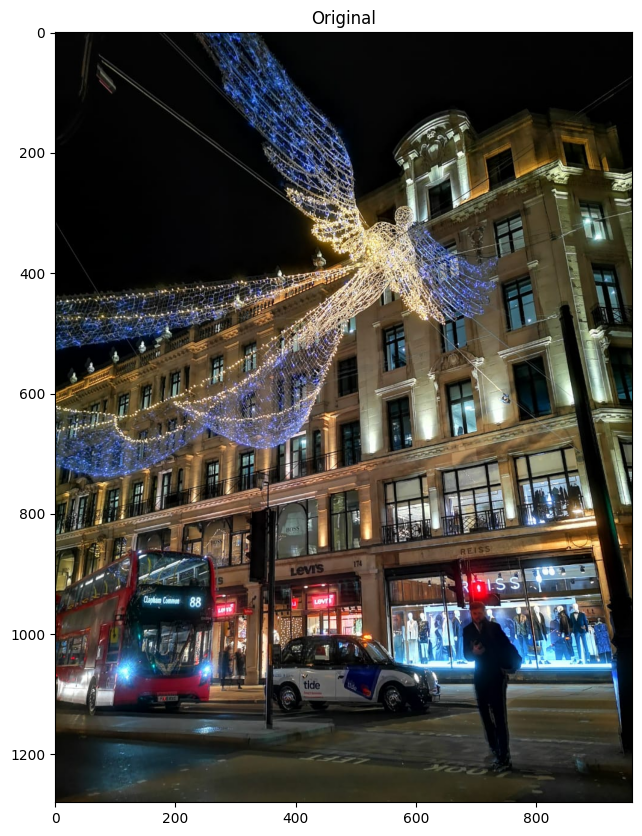

0.06788015122352506
VERIFICAÇÃO MANUAL
0.05506916598452127
0.045964492832797244
0.04303318499618014
0.026948766382453804
0.04328323521276389
0.007792781428208828
0.019602396985960335
0.05355223288411193
0.04912313956266956
0.042534399445008586
0.056699661837352755
0.05620755757162088
0.06735846728060124
0.001101892729254872
0.05037626796176964
0.016276629035286594
0.03280897845278985
0.044254242877042715
0.045845820926943004
0.04513266126041593
0.0121321293052159
0.03634772043210677
0.017063935568976674
0.04190056292807576
0.06023175693909921
0.041624392676394506
0.017615823780510853
0.04317907521469244
0.03642323517723367
0.013334053867205209
0.06036033582690592
0.0638949348115958
0.031237278031252758
0.06632184416324505
0.024760819282726332
0.024587992012851667
0.04962584852209162
0.030930363846072506
0.013537255348194388
0.058081606632950145
0.00521808844777949
0.01022104720879824
0.04896861981293876
0.0430974509988058
0.03377143592237053
0.02663544545696994
0.024654561951605647
0.0

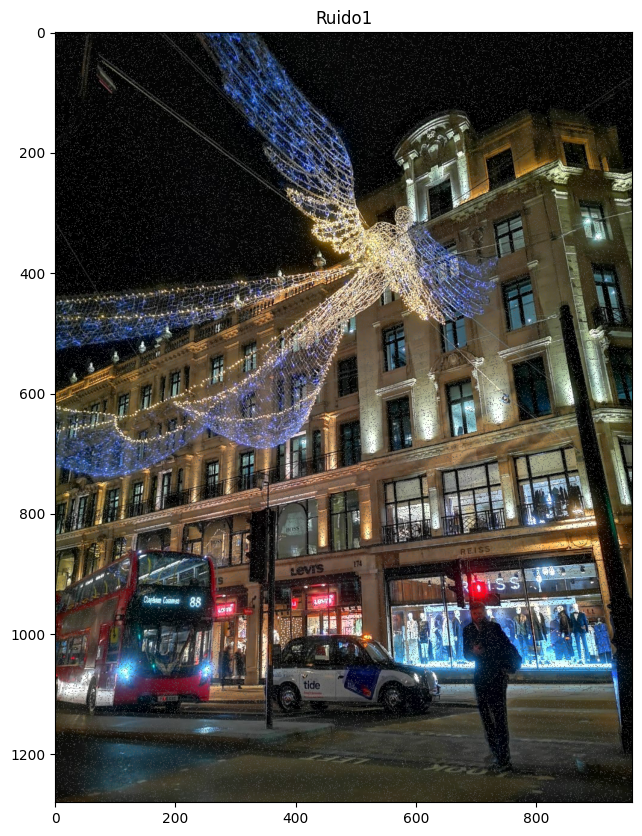

In [81]:
imagem = cv2.imread('../../images/londonxmas.jpeg')

imshow("Original", imagem)

ruido1 = adicionarRuidoBranco(imagem)
imshow("Ruido1", ruido1)

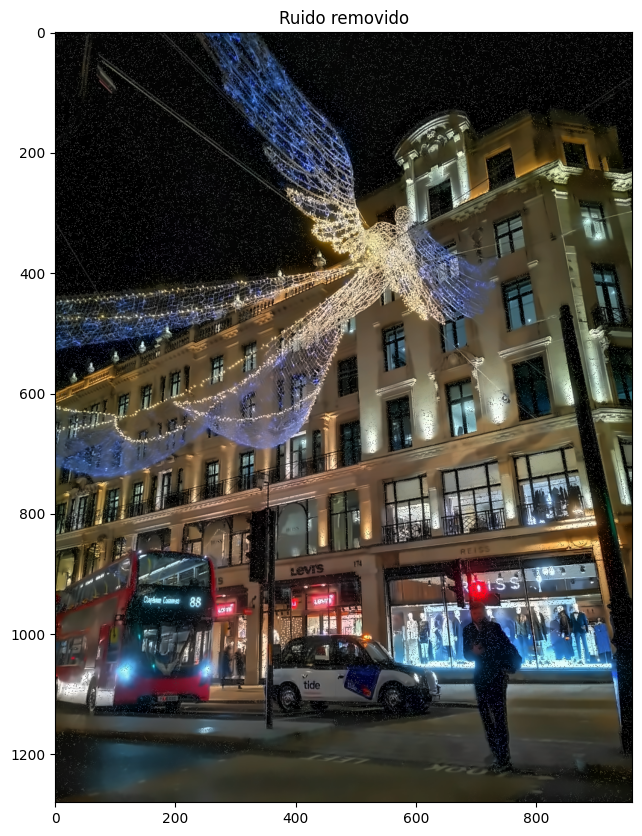

In [82]:
#REMOVENDO RUIDO

remo = cv2.fastNlMeansDenoisingColored(ruido1, None, 11, 6, 7, 21)

imshow("Ruido removido", remo)

**Existem 4 variações de redução de ruído de meios não locais**

- cv2.fastNlMeansDenoising() - funciona com uma única imagem em escala de cinza
- cv2.fastNlMeansDenoisingColored() - funciona com uma imagem colorida.
- cv2.fastNlMeansDenoisingMulti() - trabalha com uma sequência de imagens capturadas em um curto período de tempo (imagens em escala de cinza)
- cv2.fastNlMeansDenoisingColoredMulti() - igual ao anterior, mas para imagens coloridas.

# Uso da equalização de histograma

![](https://docs.opencv.org/master/histogram_equalization.png)

Isso “ajusta” a faixa dinâmica de uma imagem, fazendo com que ela se espalhe mais uniformemente de acordo com a distribuição de intensidade e, assim, melhorando o contraste.

O histograma de uma imagem é uma representação gráfica da distribuição das intensidades dos pixels. Para uma imagem em tons de cinza (8 bits), o histograma tem 256 valores possíveis (0 a 255), onde cada valor corresponde à quantidade de pixels com aquela intensidade.

Exemplo: Em uma imagem escura, o histograma terá picos nas intensidades próximas a 0 (preto).

Objetivo da equalização: Transformar o histograma original em um histograma mais uniforme, expandindo o intervalo de intensidades e melhorando o contraste.

### a) Cálculo do Histograma

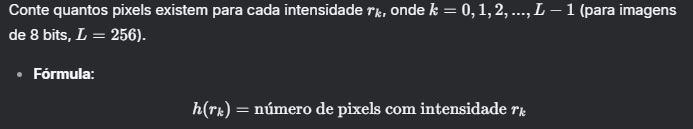

### b) Cálculo da Função de Distribuição Acumulada (CDF)

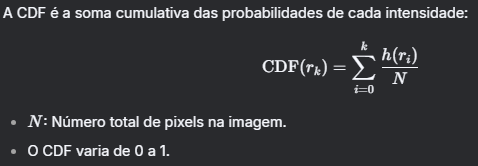

### c) Mapeamento dos Valores de Intensidade

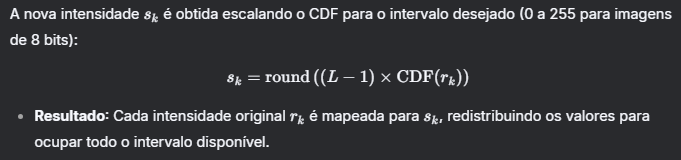


# EXEMPLO:

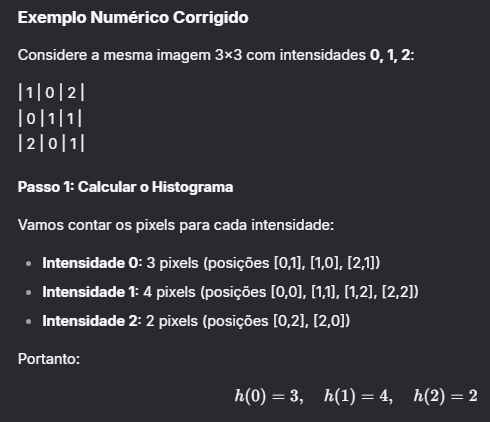

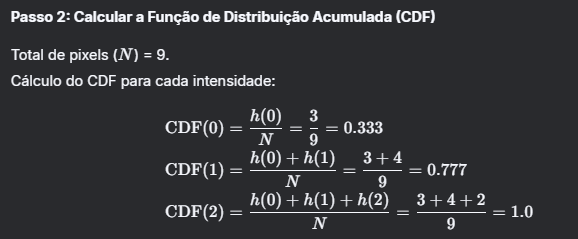

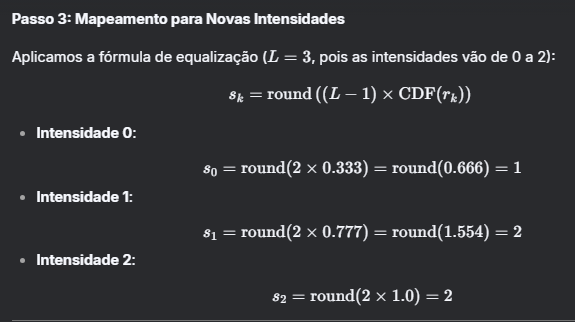

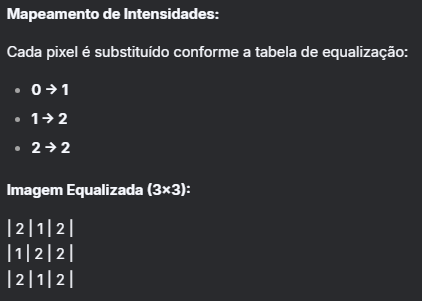

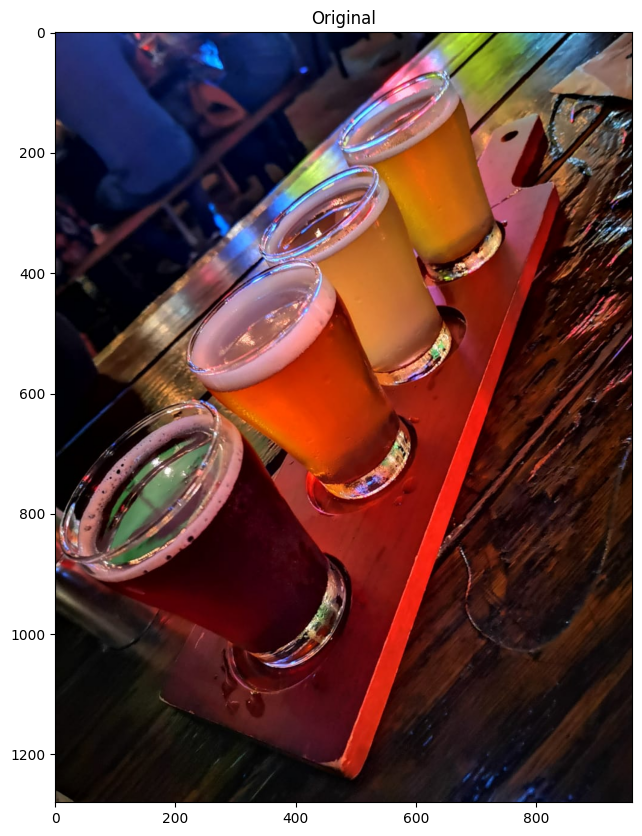

(1280, 960, 3)
1228800


C:\Users\Gabriel\AppData\Local\Temp\ipykernel_19420\1516110001.py:23: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(cinza.flatten(), 256, [0,256], color = 'r')


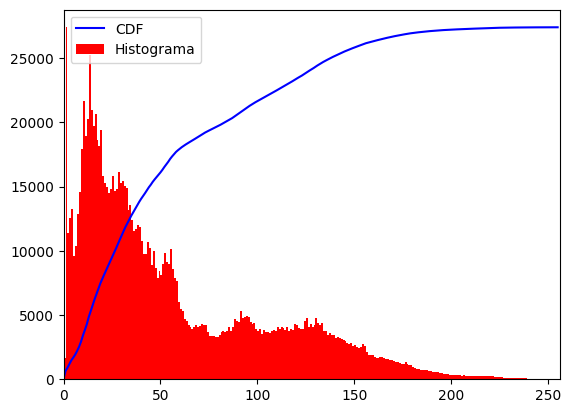

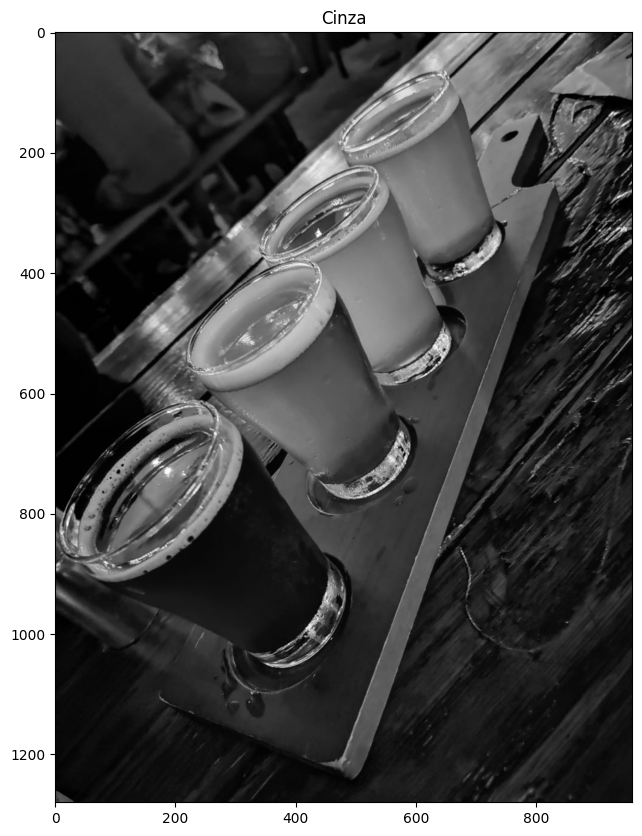

In [83]:
#ENTENDENDO O HISTOGRAMA E O CDF

imagem = cv2.imread('../../images/tommys_beers.jpeg')

imshow("Original", imagem)

print(imagem.shape)

cinza = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)

histrograma, bins = np.histogram(cinza.flatten(), 256, [0,256])

print(len(cinza.flatten()))

#Calculando a soma cumulativa
cdf = histrograma.cumsum()

#Normalizando a distribuição cumulativa

cdfNormalizado = cdf * float(histrograma.max()) / cdf.max()

plt.plot(cdfNormalizado, color = 'b')
plt.hist(cinza.flatten(), 256, [0,256], color = 'r')
plt.xlim([0, 256])
plt.legend(("CDF", "Histograma"), loc = 'upper left')
plt.show()

imshow("Cinza", cinza)


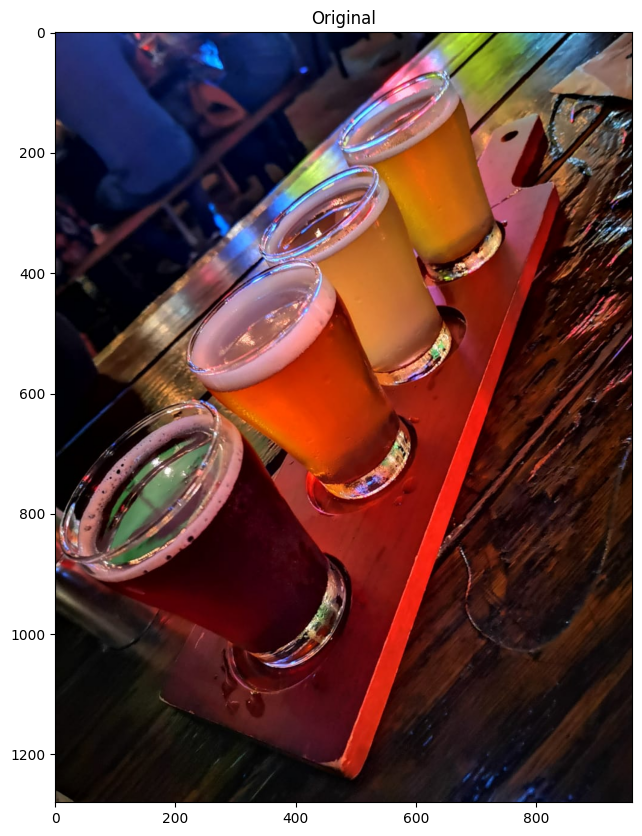

(1280, 960, 3)
1228800


C:\Users\Gabriel\AppData\Local\Temp\ipykernel_19420\3881827023.py:25: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(cinza.flatten(), 256, [0,256], color = 'r')


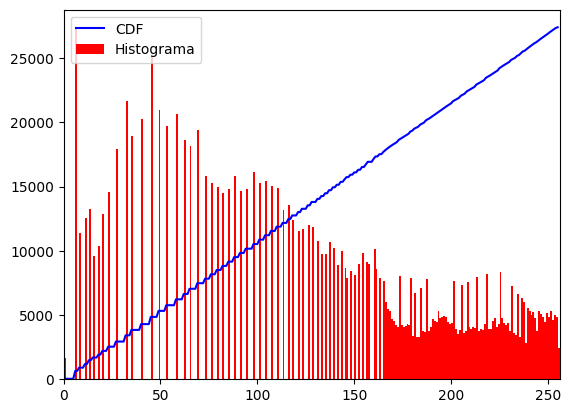

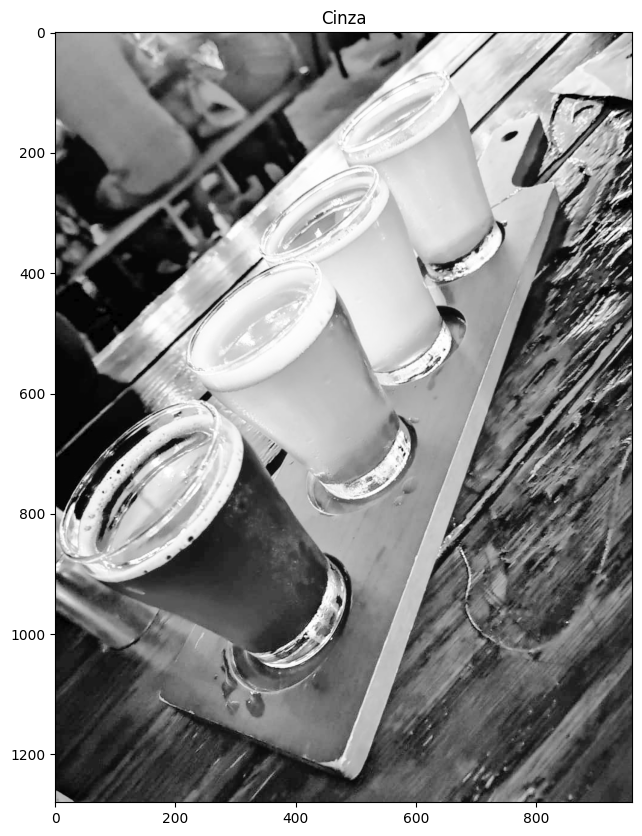

In [84]:
#APLICANDO A EQUALIZAÇÃO

imagem = cv2.imread('../../images/tommys_beers.jpeg')

imshow("Original", imagem)

print(imagem.shape)

cinza = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)

cinza = cv2.equalizeHist(cinza)

histrograma, bins = np.histogram(cinza.flatten(), 256, [0,256])

print(len(cinza.flatten()))

#Calculando a soma cumulativa
cdf = histrograma.cumsum()

#Normalizando a distribuição cumulativa

cdfNormalizado = cdf * float(histrograma.max()) / cdf.max()

plt.plot(cdfNormalizado, color = 'b')
plt.hist(cinza.flatten(), 256, [0,256], color = 'r')
plt.xlim([0, 256])
plt.legend(("CDF", "Histograma"), loc = 'upper left')
plt.show()

imshow("Cinza", cinza)

# EXERCÍCIO
**EQUALIZAR TODOS OS CANAIS RGB DA IMAGEM E JUNTA-LOS NO FINAL**

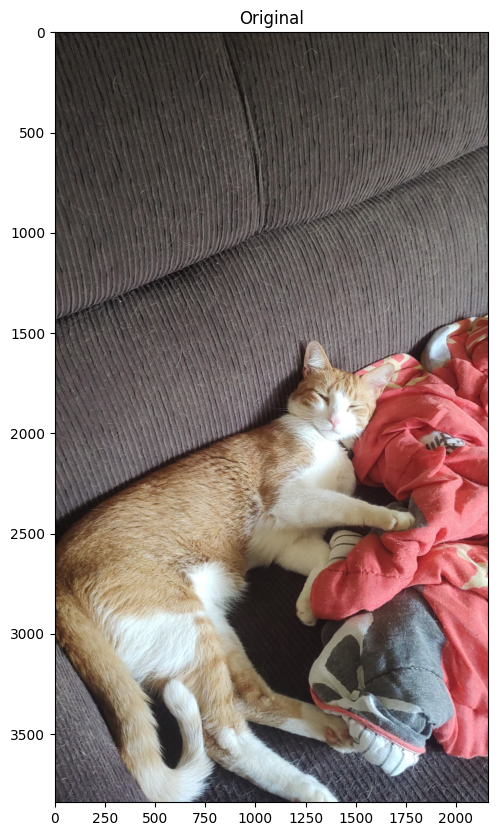

In [ ]:

imagem = cv2.imread('../../images/PatricioGatoNenudo.jpg')

imshow("Original", imagem)

red = np.zeros(imagem.shape, dtype=np.uint8)
green = np.zeros(imagem.shape, dtype=np.uint8)
blue = np.zeros(imagem.shape, dtype=np.uint8)

r, g, b = cv2.split(imagem) 
"""
TAMBEM FUNCIONA
red_channel = img[:, :, 2]
green_channel = img[:, :, 1]
blue_channel = img[:, :, 0]
"""


vermelha = cv2.equalizeHist(r)
verde = cv2.equalizeHist(g)
azul = cv2.equalizeHist(b)



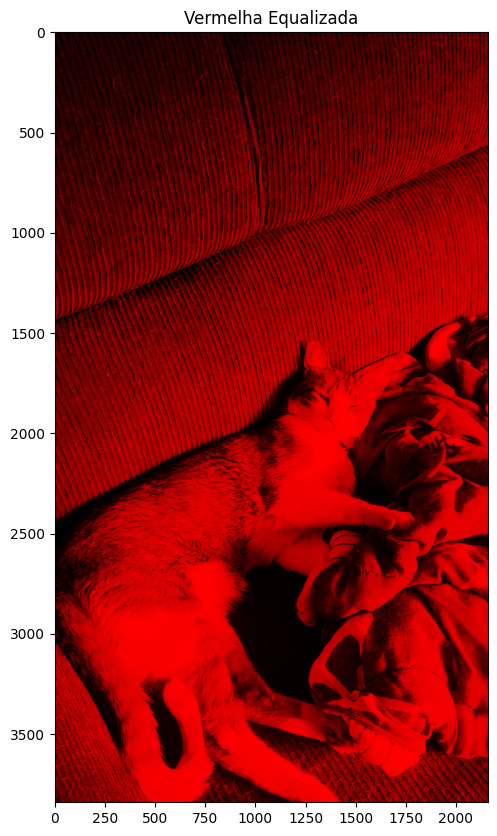

In [99]:
#VERMELHO

zerosRED = np.zeros(imagem.shape, dtype=np.uint8)

zerosRED[:, :, 2] = vermelha

imshow("Vermelha Equalizada", zerosRED)


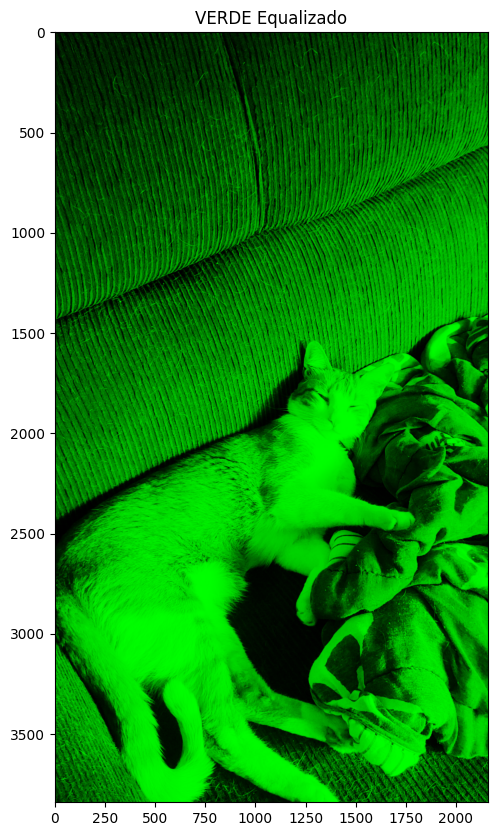

In [100]:
#VERDE

zerosGREEN = np.zeros(imagem.shape, dtype=np.uint8)

zerosGREEN[:, :, 1] = verde

imshow("VERDE Equalizado", zerosGREEN)

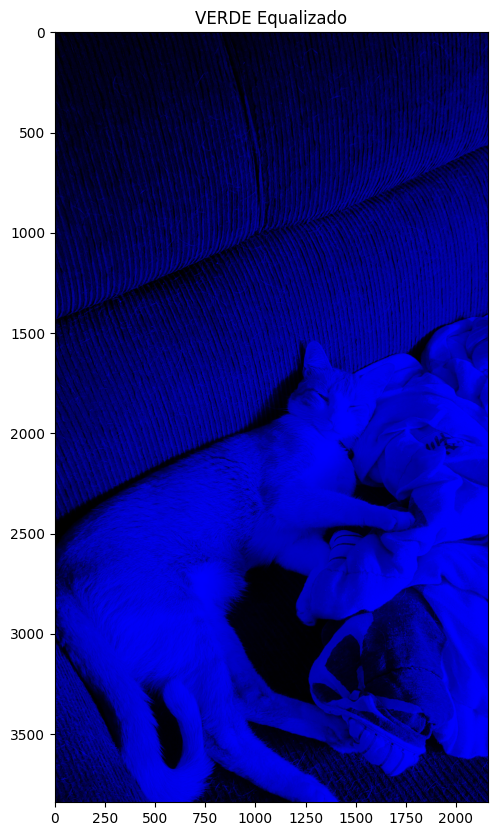

In [101]:
#AZUL

zerosBLUE = np.zeros(imagem.shape, dtype=np.uint8)

zerosBLUE[:, :, 0] = azul

imshow("VERDE Equalizado", zerosBLUE)

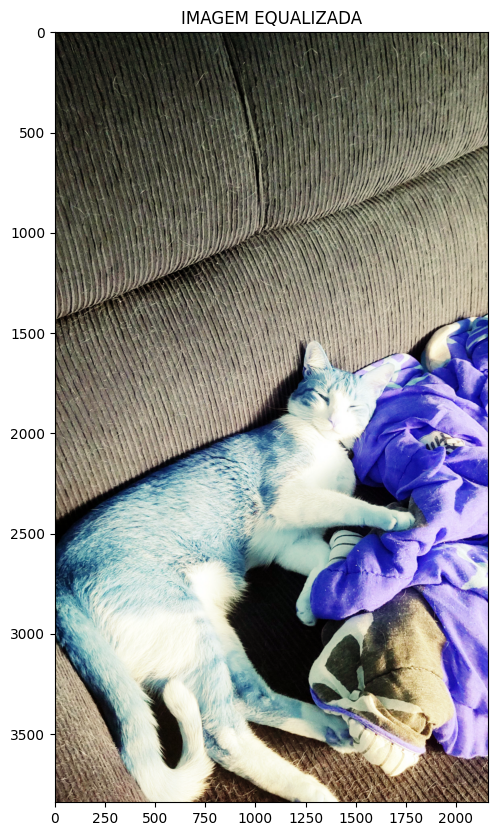

In [103]:
imagemEqualizada = cv2.merge([azul, verde, vermelha])

imshow("IMAGEM EQUALIZADA", imagemEqualizada)